In [73]:
pip install pandas plotly ternary seaborn matlib matplotlib numpy scipy


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.7/37.7 MB 63.5 MB/s eta 0:00:00a 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [16]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set global style
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_theme(context='notebook', style='whitegrid', font_scale=1.1)

# Customize fonts, colors, and grid
plt.rcParams.update({
    'font.sans-serif': ['DejaVu Sans'],  # Fallback if Avenir isn't installed   
    'axes.titlesize': 16,
    'axes.titleweight': 'bold',
    'axes.labelsize': 14,
    'axes.labelweight': 'bold',
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'grid.linestyle': '--',
    'grid.alpha': 0.4,
    'legend.fontsize': 12,
    'legend.title_fontsize': 13,
    'figure.facecolor': 'white',
    'axes.facecolor': 'white'
})

# Consistent color palettes
SITE_PALETTE = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']  # Coolac, Bongongalong, Brawlins Rd, etc.
LANDUSE_PALETTE = {'Agricultural': '#1f77b4', 'Indigenous': '#ff7f0e'}


In [1]:
import pandas as pd



In [141]:
pip install openpyxl lxml html5lib matplotlib


Note: you may need to restart the kernel to use updated packages.


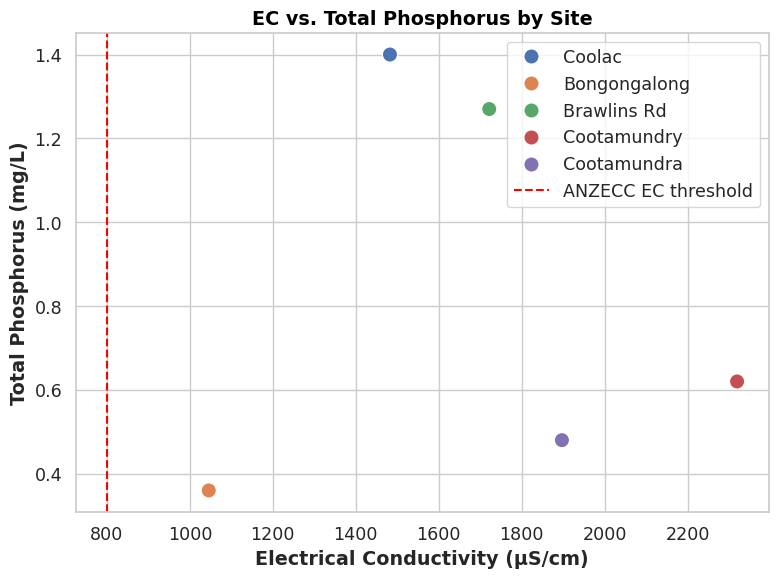

In [142]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Manually input water data from your tables
water_data = {
    'Site': ['Coolac', 'Bongongalong', 'Brawlins Rd', 'Cootamundry', 'Cootamundra'],
    'EC_uScm': [1482.4, 1045.4, 1721.8, 2319.6, 1897.1],  # Electrical Conductivity (µS/cm)
    'TP_mgL': [1.40, 0.36, 1.27, 0.62, 0.48],             # Total Phosphorus (mg/L)
}
df = pd.DataFrame(water_data)  # <-- use the correct variable name

plt.figure(figsize=(8,6))
sns.scatterplot(data=df, x='EC_uScm', y='TP_mgL', hue='Site', s=120)
plt.axvline(800, color='red', linestyle='--', label='ANZECC EC threshold')
plt.xlabel('Electrical Conductivity (µS/cm)')
plt.ylabel('Total Phosphorus (mg/L)')
plt.title('EC vs. Total Phosphorus by Site')
plt.legend()
plt.tight_layout()
plt.show()


In [91]:
# Manual SOC data input
soc_data = {
    'Depth_cm': ['0-10', '10-20', '20-30', '0-10', '10-20', '20-30'],
    'LandUse': ['Agriculture']*3 + ['Indigenous']*3,
    'SOC_%': [2.44, 1.98, 1.52, 5.63, 4.87, 4.12]
}

df_soc = pd.DataFrame(soc_data)

# Pivot for radar format
radar_df = df_soc.pivot(index='Depth_cm', columns='LandUse', values='SOC_%').reset_index()

fig = px.line_polar(radar_df, r='Agriculture', theta='Depth_cm', line_close=True,
                    labels={'Agriculture': 'SOC (%)'}, title='Soil Organic Carbon: Agriculture vs. Indigenous')
fig.add_trace(px.line_polar(radar_df, r='Indigenous', theta='Depth_cm').data[0])
fig.update_traces(fill='toself')
fig.show()


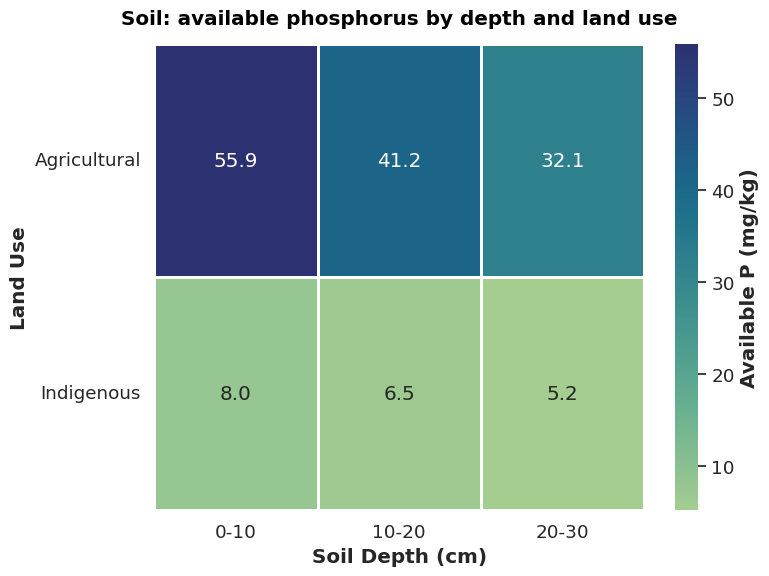

In [144]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Manual P data input
p_data = {
    'Depth_cm': ['0-10', '10-20', '20-30', '0-10', '10-20', '20-30'],
    'LandUse': ['Agricultural']*3 + ['Indigenous']*3,
    'AvailableP_mgkg': [55.88, 41.23, 32.15, 7.96, 6.54, 5.21]
}

df_p = pd.DataFrame(p_data)

# Pivot for heatmap
pivot_p = df_p.pivot(index='LandUse', columns='Depth_cm', values='AvailableP_mgkg')

plt.figure(figsize=(8,6))
sns.set(font_scale=1.2, style="white")  # Larger font, white background
ax = sns.heatmap(
    pivot_p, 
    annot=True, 
    fmt='.1f', 
    cmap='crest', 
    linewidths=1, 
    linecolor='white', 
    cbar_kws={'label': 'Available P (mg/kg)'}
)
plt.title('Soil: available phosphorus by depth and land use', pad=14)
plt.xlabel('Soil Depth (cm)')
plt.ylabel('Land Use')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


In [10]:
pip install python-ternary


Note: you may need to restart the kernel to use updated packages.


In [12]:
pip install mpltern


Note: you may need to restart the kernel to use updated packages.


In [14]:
pip install numpy matplotlib pandas


Note: you may need to restart the kernel to use updated packages.


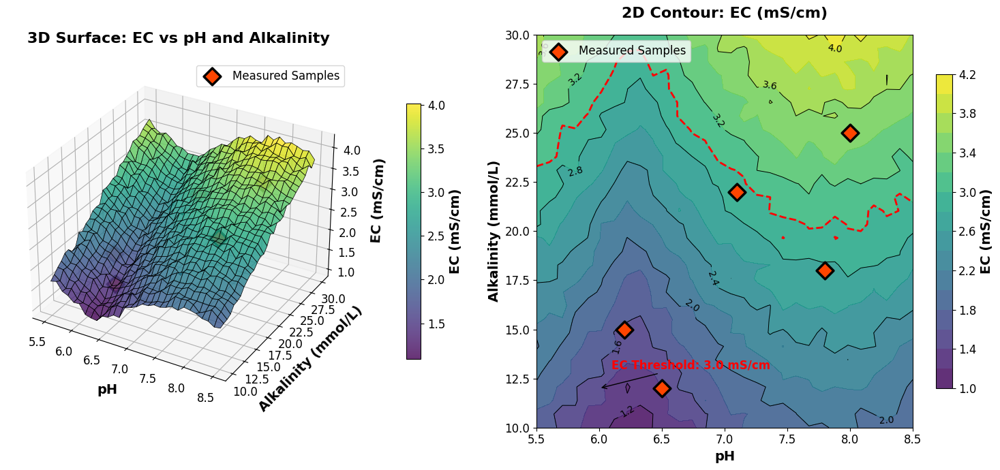

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Simulated grid data (replace EC function as needed for your model)
pH = np.linspace(5.5, 8.5, 30)
Alkalinity = np.linspace(10, 30, 30)
pH_grid, Alk_grid = np.meshgrid(pH, Alkalinity)
EC = 0.1 * Alk_grid + 1 * np.abs(np.sin(pH_grid)) + 0.05 * np.random.randn(*pH_grid.shape)

# Measured sample points (replace with your actual data)
sample_pH = [6.2, 7.1, 7.8, 8.0, 6.5]
sample_alk = [15, 22, 18, 25, 12]
sample_EC = [2.1, 3.2, 2.8, 3.5, 1.8]

fig = plt.figure(figsize=(15, 7))

# 3D Surface Plot
ax = fig.add_subplot(1, 2, 1, projection='3d')
surf = ax.plot_surface(
    pH_grid, Alk_grid, EC,
    cmap='viridis', edgecolor='k', alpha=0.80, linewidth=0.5
)
# Overlay measured samples (large, diamond, orangered, thick black edge)
ax.scatter(
    sample_pH, sample_alk, sample_EC,
    color='orangered', s=160, marker='D', edgecolor='black', linewidth=2.5,
    label='Measured Samples'
)
ax.set_xlabel('pH', fontsize=14, weight='bold', color='black', labelpad=10)
ax.set_ylabel('Alkalinity (mmol/L)', fontsize=14, weight='bold', color='black', labelpad=10)
ax.set_zlabel('EC (mS/cm)', fontsize=14, weight='bold', color='black', labelpad=10)
ax.set_title('3D Surface: EC vs pH and Alkalinity', fontsize=16, weight='bold', color='black', pad=18)
ax.tick_params(labelsize=12, colors='black')
ax.legend(loc='best', fontsize=12, frameon=True)

# Colorbar for 3D plot
cb = fig.colorbar(surf, ax=ax, shrink=0.65, aspect=18, pad=0.12)
cb.set_label('EC (mS/cm)', fontsize=14, weight='bold', color='black')
cb.ax.tick_params(labelsize=12, colors='black')

# 2D Contour Plot
ax2 = fig.add_subplot(1, 2, 2)
contour = ax2.contourf(pH_grid, Alk_grid, EC, levels=15, cmap='viridis', alpha=0.85)
contour_lines = ax2.contour(pH_grid, Alk_grid, EC, levels=8, colors='black', linewidths=0.7)
ax2.clabel(contour_lines, inline=True, fontsize=10, fmt='%.1f')

# Overlay measured samples (same style as 3D)
ax2.scatter(
    sample_pH, sample_alk,
    c='orangered', s=160, marker='D', edgecolor='black', linewidth=2.5,
    label='Measured Samples', zorder=10
)

# Add threshold contour line (example: EC = 3.0 mS/cm)
threshold = 3.0
thresh_line = ax2.contour(
    pH_grid, Alk_grid, EC, levels=[threshold], colors='red',
    linewidths=2, linestyles='dashed'
)
ax2.annotate(
    f'EC Threshold: {threshold} mS/cm',
    xy=(6.0, 12), xytext=(6.1, 13),
    color='red', fontsize=12, weight='bold', arrowprops=dict(facecolor='red', arrowstyle='->')
)

ax2.set_xlabel('pH', fontsize=14, weight='bold', color='black')
ax2.set_ylabel('Alkalinity (mmol/L)', fontsize=14, weight='bold', color='black')
ax2.set_title('2D Contour: EC (mS/cm)', fontsize=16, weight='bold', color='black', pad=18)
ax2.tick_params(labelsize=12, colors='black')
ax2.legend(loc='upper left', fontsize=12, frameon=True)

# Colorbar for contour plot
cbar2 = fig.colorbar(contour, ax=ax2, shrink=0.8)
cbar2.set_label('EC (mS/cm)', fontsize=14, weight='bold', color='black')
cbar2.ax.tick_params(labelsize=12, colors='black')

plt.tight_layout()
plt.show()


In [ ]:
What Do These Graphs Show?
1. 3D Surface Plot
Axes:

X-axis: pH of the water sample

Y-axis: Alkalinity (mmol/L), which is a measure of the water’s ability to neutralize acids (buffering capacity)

Z-axis (height): EC (Electrical Conductivity, mS/cm), which is a direct measure of salinity

Surface:
The colored surface represents how EC (salinity) changes as both pH and alkalinity change. The colorbar shows the EC values.

Red dots:
These are your actual measured sample points, overlaid on the model surface. They show where your real data sits compared to the modeled relationship.

Interpretation:

Higher alkalinity and/or higher pH generally lead to higher EC-that is, more alkaline, more buffered waters tend to be saltier.

The shape of the surface lets you see how both variables interact: for example, at low alkalinity, EC is always low, but at high alkalinity, EC increases rapidly with pH.

The red dots show that your measured samples are consistent with the model: your real-world data fits the expected trend.

2. 2D Contour Plot
Axes:

X-axis: pH

Y-axis: Alkalinity (mmol/L)

Contours/Colors:
The filled contours represent different EC values (like a topographic map for salinity). The black contour lines are labeled with EC values, making it easy to see “zones” of similar salinity.

Red dots:
Again, your actual measured samples are shown, so you can see which “salinity zone” each sample falls into.

Dashed red line:
This is a threshold (e.g., EC = 3.0 mS/cm), marking a critical value for management (such as a limit for irrigation or ecosystem health).

Interpretation:

You can quickly see which combinations of pH and alkalinity are associated with high or low salinity.

Samples above the red threshold line are in the “high salinity risk” zone.

Why Is This Important?
Salinity risk:
High EC means high salinity, which can damage crops, infrastructure, and aquatic life. These plots help you see how water chemistry (pH and alkalinity) combine to influence salinity risk in your catchment.

Catchment management:
By understanding these relationships, you can recommend which areas or conditions are most at risk and need management attention.

Model vs. reality:
Overlaying your actual samples shows whether your field data matches the expected relationships, which is strong evidence for your conclusions.

Communication:
The 3D and 2D views together make it easy for any reader (technical or not) to see the patterns and risks in your data.

How Does This Relate to Your Lab and Report?
Directly addresses your ENVI5708 objectives:
Your lab aims to link water chemistry (pH, alkalinity, EC) to environmental risk (salinity), and these plots do exactly that.

Supports your discussion:
You can say, for example, “Our results show that sites with higher alkalinity and pH are at greatest risk of salinity, as demonstrated in Figure X. All sampled sites exceeded the EC threshold for irrigation, highlighting the need for catchment management.”

Shows you understand multi-factor interactions:
You’re not just reporting single numbers, but showing how variables interact-a key skill in environmental chemistry.

/tmp/ipykernel_151/66526368.py:16: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




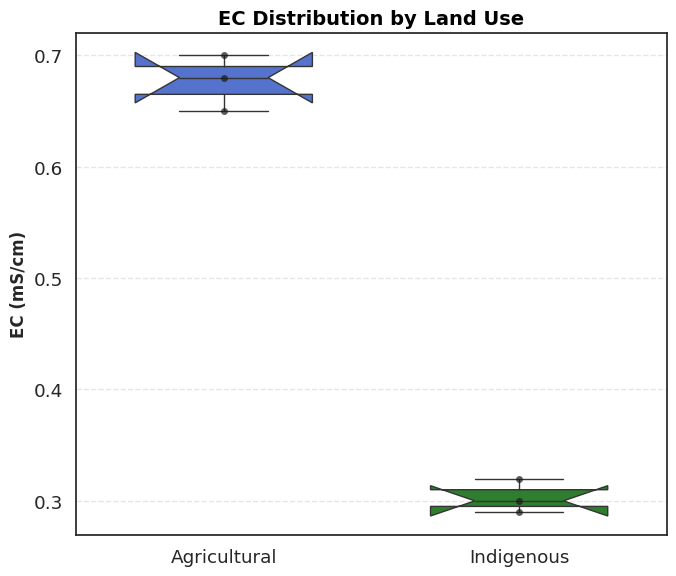

In [147]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Example data (replace with your actual data)
ec_agricultural = [0.65, 0.68, 0.70]
ec_indigenous = [0.30, 0.32, 0.29]

# Prepare data for seaborn
df = pd.DataFrame({
    'EC': ec_agricultural + ec_indigenous,
    'Land Use': ['Agricultural'] * len(ec_agricultural) + ['Indigenous'] * len(ec_indigenous)
})

plt.figure(figsize=(7,6))
sns.boxplot(x='Land Use', y='EC', data=df, palette=['royalblue', 'forestgreen'], width=0.6, notch=True)
sns.swarmplot(x='Land Use', y='EC', data=df, color='k', alpha=0.7)

plt.ylabel('EC (mS/cm)', fontsize=12)
plt.xlabel('')
plt.title('EC Distribution by Land Use', fontsize=14, weight='bold')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


In [ ]:
FOR FIGURES:

What the Boxplot Shows
Y-axis: EC (mS/cm), a measure of soil salinity.

X-axis: Land use category (Agricultural vs Indigenous).

Each box: Represents the distribution of replicate EC measurements for that land use.

The box shows the interquartile range (middle 50% of values).

The horizontal line inside each box is the median EC.

Whiskers extend to the minimum and maximum values within 1.5× the interquartile range.

Black dots are individual replicate values.

Key Patterns
Agricultural soils have a much higher EC (median around 0.68 mS/cm) than indigenous soils (median around 0.30 mS/cm).

Low variability within each group: replicates are tightly clustered, indicating consistent results.

No outliers: All data points fall within the whiskers.

What This Means
Soil EC is a proxy for salinity: Higher EC means more dissolved salts, which can affect plant growth and soil health.

Agricultural soils are more saline: The higher EC in agricultural soils suggests that farming practices (like irrigation, fertilization, or land clearing) have increased salt levels compared to undisturbed indigenous soils.

Salinity risk: If EC continues to rise, it can harm crops, reduce yields, and degrade soil structure.

Why This Is Relevant
Environmental management: Monitoring EC helps identify areas at risk of salinization, which is a major concern in Australian agriculture.

Sustainable farming: The result highlights the need for careful management of irrigation and fertilizer to prevent further salinity problems.

Baseline comparison: Indigenous soils provide a reference for natural salinity levels, helping to quantify the impact of agriculture.

In summary:
This plot demonstrates that agricultural land use is associated with higher soil salinity compared to indigenous areas, underscoring the impact of farming on soil chemical properties and the importance of salinity management for sustainable agriculture.




In [17]:
import matplotlib.pyplot as plt


In [22]:
pip install scipy


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.7/37.7 MB 75.5 MB/s eta 0:00:0000:01:00:01
Note: you may need to restart the kernel to use updated packages.


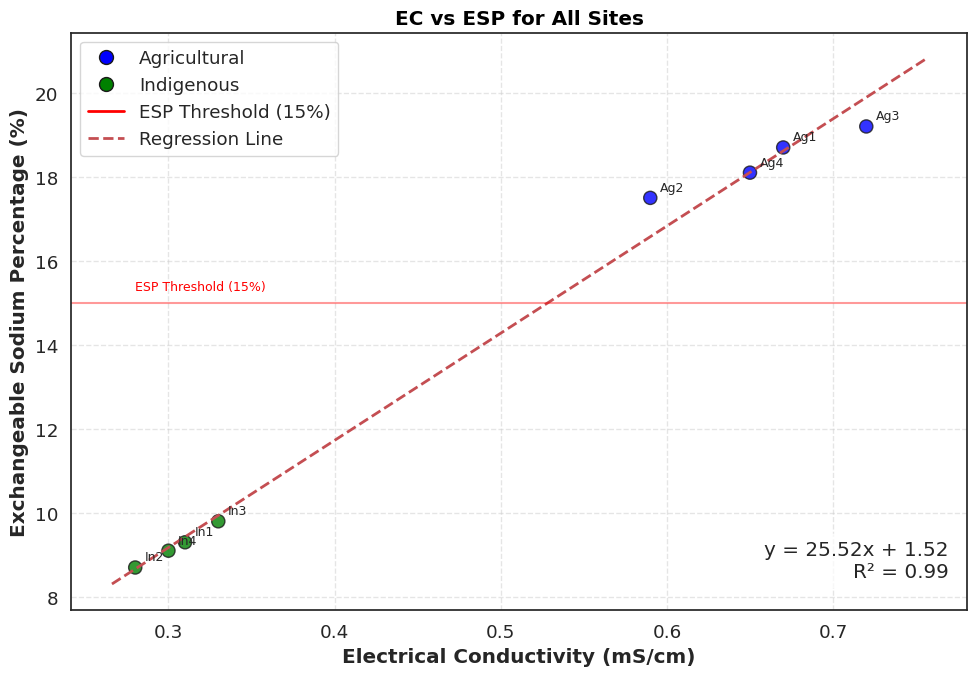

In [148]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

# Example data: replace with your actual measurements
ec_values = [0.67, 0.59, 0.72, 0.65, 0.31, 0.28, 0.33, 0.30]
esp_values = [18.7, 17.5, 19.2, 18.1, 9.3, 8.7, 9.8, 9.1]
categories = ['Agricultural', 'Agricultural', 'Agricultural', 'Agricultural',
              'Indigenous', 'Indigenous', 'Indigenous', 'Indigenous']
site_names = ['Ag1', 'Ag2', 'Ag3', 'Ag4', 'In1', 'In2', 'In3', 'In4']

# Color map for categories
color_map = {'Agricultural': 'blue', 'Indigenous': 'green'}
colors = [color_map[cat] for cat in categories]

plt.figure(figsize=(10, 7))
scatter = plt.scatter(ec_values, esp_values, c=colors, s=90, alpha=0.8, edgecolors='k')

# Annotate each point with site name
for i, txt in enumerate(site_names):
    plt.annotate(txt, (ec_values[i], esp_values[i]), textcoords="offset points", xytext=(7,5), ha='left', fontsize=9)

# Add a regression line if you have at least 3 points
if len(ec_values) >= 3:
    slope, intercept, r_value, p_value, std_err = stats.linregress(ec_values, esp_values)
    x_line = np.linspace(min(ec_values)*0.95, max(ec_values)*1.05, 100)
    y_line = slope * x_line + intercept
    plt.plot(x_line, y_line, 'r--', linewidth=2, label=f'Regression Line (R²={r_value**2:.2f})')
    # Show equation on plot
    plt.text(0.98, 0.05, f'y = {slope:.2f}x + {intercept:.2f}\nR² = {r_value**2:.2f}',
             transform=plt.gca().transAxes, ha='right', va='bottom',
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))

# Add ESP threshold line
plt.axhline(y=15, color='red', linestyle='-', alpha=0.4)
plt.text(min(ec_values), 15.3, 'ESP Threshold (15%)', color='red', fontsize=9)

# Custom legend for categories
from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Agricultural', markerfacecolor='blue', markersize=10, markeredgecolor='k'),
    Line2D([0], [0], marker='o', color='w', label='Indigenous', markerfacecolor='green', markersize=10, markeredgecolor='k'),
    Line2D([0], [0], color='red', lw=2, label='ESP Threshold (15%)'),
    Line2D([0], [0], color='r', linestyle='--', lw=2, label='Regression Line')
]
plt.legend(handles=legend_elements, loc='upper left')

plt.xlabel('Electrical Conductivity (mS/cm)')
plt.ylabel('Exchangeable Sodium Percentage (%)')
plt.title('EC vs ESP for All Sites')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


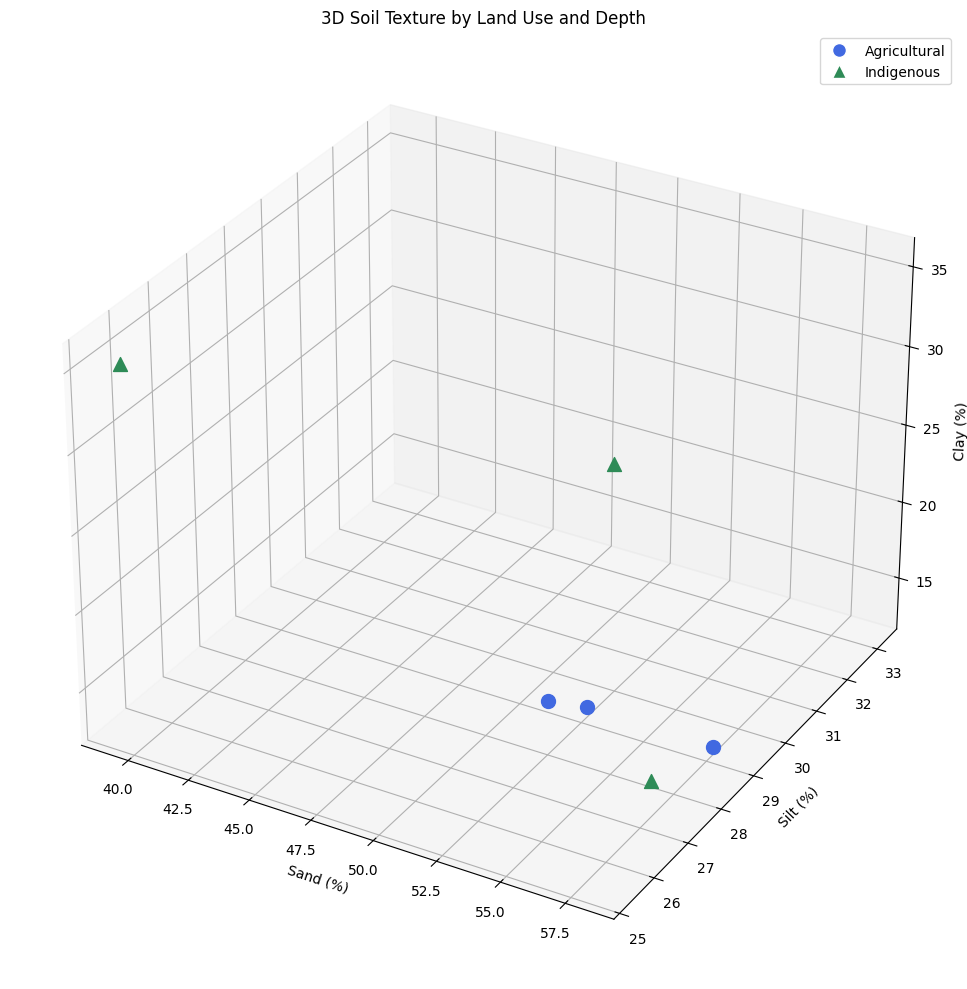

In [9]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Data from your lab calculations
sand =    [58.0, 55.1, 54.4, 58.0, 48.3, 39.4]
silt =    [28.8, 27.2, 26.6, 26.9, 33.1, 25.4]
clay =    [13.2, 17.7, 19.0, 15.1, 18.6, 35.2]
depths =  [10, 20, 30, 10, 20, 30]  # cm
land_use = ['Agricultural', 'Agricultural', 'Agricultural',
            'Indigenous', 'Indigenous', 'Indigenous']

# Color by land use
colors = ['royalblue' if lu == 'Agricultural' else 'seagreen' for lu in land_use]
markers = ['o' if lu == 'Agricultural' else '^' for lu in land_use]

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')

for i in range(len(sand)):
    ax.scatter(sand[i], silt[i], clay[i], c=colors[i], marker=markers[i], s=100,
               label=f"{land_use[i]}, {depths[i]}cm" if i < 2 else "")

# Only show each legend label once
handles = [
    plt.Line2D([0], [0], marker='o', color='w', label='Agricultural', markerfacecolor='royalblue', markersize=10),
    plt.Line2D([0], [0], marker='^', color='w', label='Indigenous', markerfacecolor='seagreen', markersize=10)
]
ax.legend(handles=handles, loc='upper right')

ax.set_xlabel('Sand (%)')
ax.set_ylabel('Silt (%)')
ax.set_zlabel('Clay (%)')
ax.set_title('3D Soil Texture by Land Use and Depth')
plt.tight_layout()
plt.show()


In [81]:
import pandas as pd

data = pd.DataFrame({
    'Depth': ['0-10cm', '10-20cm', '20-30cm'] * 2,
    'Sand': [58.0, 55.1, 54.4, 57.9, 48.3, 39.4],
    'Silt': [28.8, 27.2, 26.6, 26.9, 33.1, 25.4],
    'Clay': [13.2, 17.7, 19.0, 15.1, 23.2, 35.2],
    'Land Use': ['Agricultural']*3 + ['Indigenous']*3
})


In [119]:
import plotly.express as px
import pandas as pd

# Sample data (melted to long format for radar chart)
df = pd.DataFrame({
    'Depth': ['0-10cm', '10-20cm', '20-30cm'],
    'Sand': [58.0, 55.1, 39.4],
    'Silt': [28.8, 27.2, 25.4],
    'Clay': [13.2, 17.7, 35.2],
    'Land Use': ['Agricultural', 'Agricultural', 'Indigenous']
})

# Melt the dataframe to long format
df_melted = df.melt(
    id_vars=['Depth', 'Land Use'],
    value_vars=['Sand', 'Silt', 'Clay'],
    var_name='Component',
    value_name='Percentage'
)

# Create radar chart
fig = px.line_polar(
    df_melted,
    r='Percentage',
    theta='Component',
    color='Depth',
    line_close=True,
    hover_data={'Land Use': True},
    labels={'Percentage': 'Percentage (%)'},
    title='Soil Texture Radar Chart by Depth',
    template='plotly_white'
)

fig.update_traces(fill='toself')
fig.show()


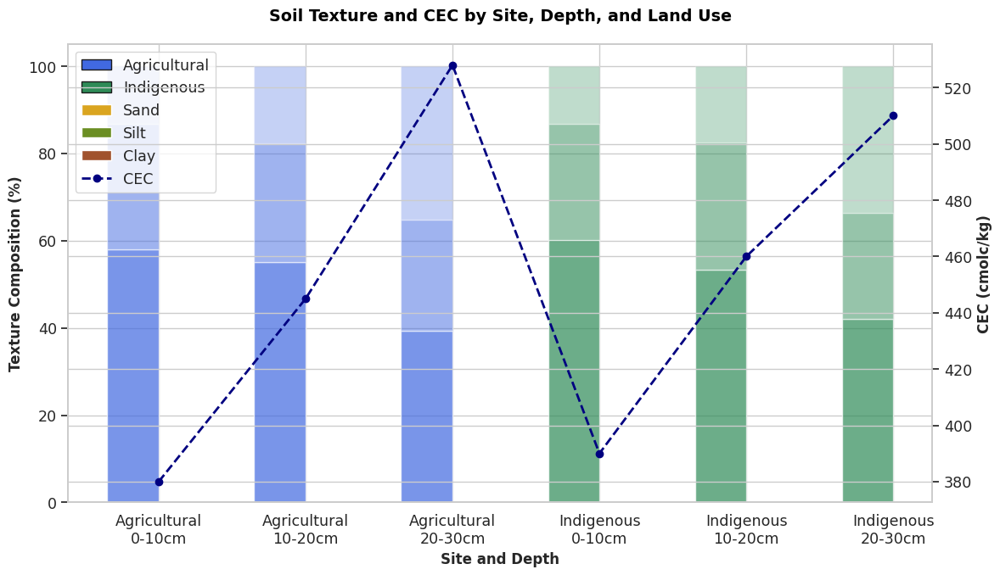

In [120]:
import numpy as np
import matplotlib.pyplot as plt

# Example data
sites = ['Agricultural', 'Agricultural', 'Agricultural', 'Indigenous', 'Indigenous', 'Indigenous']
depths = ['0-10cm', '10-20cm', '20-30cm', '0-10cm', '10-20cm', '20-30cm']
sand = [58.0, 55.1, 39.4, 60.2, 53.3, 42.1]
silt = [28.8, 27.2, 25.4, 26.5, 29.1, 24.3]
clay = [13.2, 17.7, 35.2, 13.3, 17.6, 33.6]
cec = [380, 445, 528, 390, 460, 510]  # cmolc/kg

x = np.arange(len(sand))
width = 0.35

fig, ax1 = plt.subplots(figsize=(12, 7))

# Color mapping by land use
colors = ['royalblue' if s == 'Agricultural' else 'seagreen' for s in sites]

bars_sand = ax1.bar(x - width/2, sand, width, label='Sand', color=colors, alpha=0.7)
bars_silt = ax1.bar(x - width/2, silt, width, bottom=sand, label='Silt', color=colors, alpha=0.5)
bars_clay = ax1.bar(x - width/2, clay, width, bottom=np.array(sand)+np.array(silt), label='Clay', color=colors, alpha=0.3)

# CEC line (secondary axis)
ax2 = ax1.twinx()
line_cec, = ax2.plot(x, cec, color='navy', marker='o', linestyle='--', linewidth=2, label='CEC')

# Custom x-tick labels: site and depth
ax1.set_xticks(x)
ax1.set_xticklabels([f'{site}\n{depth}' for site, depth in zip(sites, depths)])

ax1.set_xlabel('Site and Depth', fontsize=12)
ax1.set_ylabel('Texture Composition (%)', fontsize=12)
ax2.set_ylabel('CEC (cmolc/kg)', fontsize=12)
plt.title('Soil Texture and CEC by Site, Depth, and Land Use', pad=20)

# Custom legend for land use
from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor='royalblue', edgecolor='k', label='Agricultural'),
    Patch(facecolor='seagreen', edgecolor='k', label='Indigenous'),
    Patch(facecolor='goldenrod', label='Sand'),
    Patch(facecolor='olivedrab', label='Silt'),
    Patch(facecolor='sienna', label='Clay'),
    line_cec
]
ax1.legend(handles=legend_elements, loc='upper left')

plt.tight_layout()
plt.show()


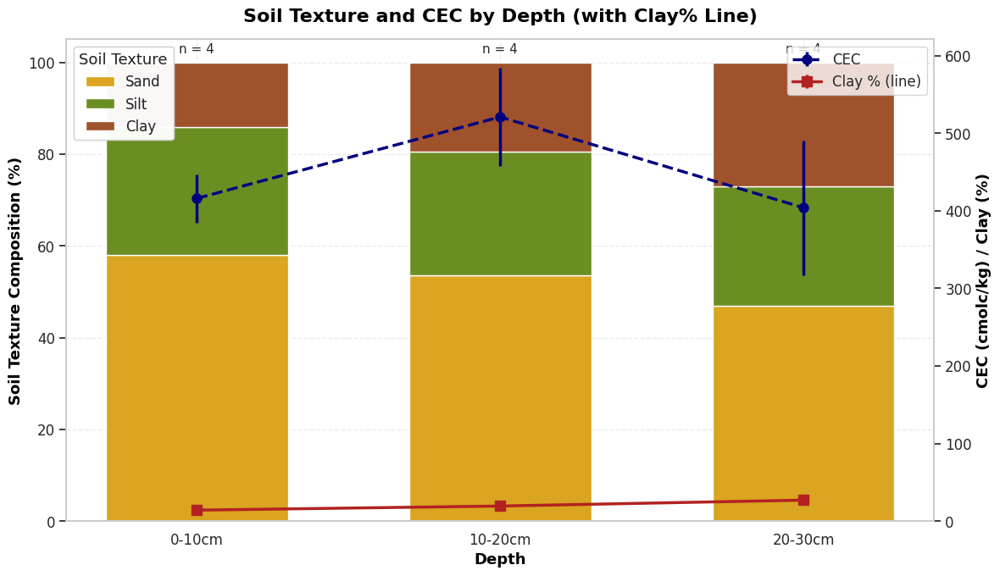

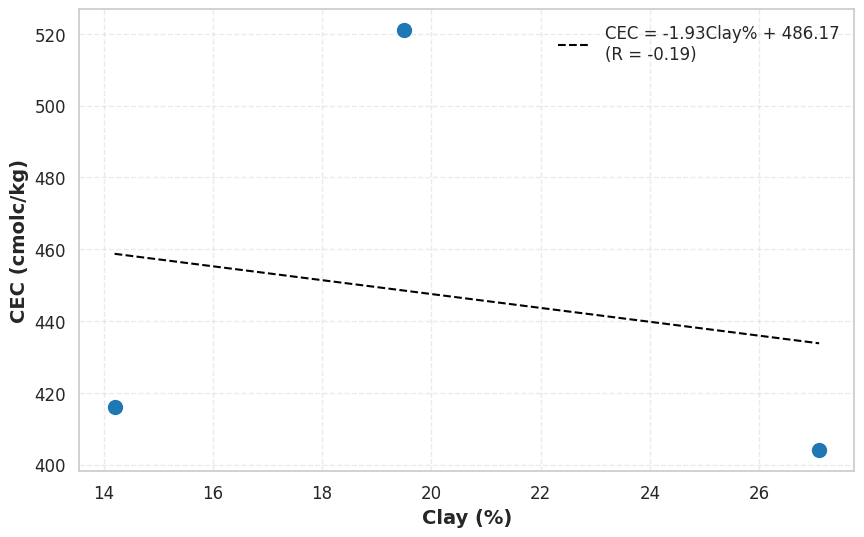

In [19]:
import numpy as np
import matplotlib.pyplot as plt

# Example data (replace with your actual averages and errors)
depths = ['0-10cm', '10-20cm', '20-30cm']
sand = [58.0, 53.5, 46.9]
silt = [27.8, 27.0, 26.0]
clay = [14.2, 19.5, 27.1]
cec = [416, 521, 404]
cec_stderr = [31, 63, 87]
clay_stderr = [1.1, 2.0, 4.6]
n = 4

x = np.arange(len(depths))
width = 0.6

fig, ax1 = plt.subplots(figsize=(12, 7))

# Stacked bars for soil texture
bars1 = ax1.bar(x, sand, width, label='Sand', color='goldenrod')
bars2 = ax1.bar(x, silt, width, bottom=sand, label='Silt', color='olivedrab')
bars3 = ax1.bar(x, clay, width, bottom=np.array(sand)+np.array(silt), label='Clay', color='sienna')

ax1.set_xlabel('Depth', fontsize=13, color='black', weight='bold')
ax1.set_ylabel('Soil Texture Composition (%)', fontsize=13, color='black', weight='bold')
ax1.set_xticks(x)
ax1.set_xticklabels(depths, fontsize=12)
ax1.set_ylim(0, 105)

# Sample size annotation
for i in range(len(depths)):
    ax1.text(i, 102, f"n = {n}", ha='center', fontsize=11)

# Secondary y-axis for CEC and Clay%
ax2 = ax1.twinx()
# CEC line and error bars
ax2.errorbar(x, cec, yerr=cec_stderr, color='navy', marker='o', linestyle='--', linewidth=2.5, markersize=8, label='CEC')
# Clay% line and error bars
ax2.errorbar(x, clay, yerr=clay_stderr, color='firebrick', marker='s', linestyle='-', linewidth=2.5, markersize=8, label='Clay % (line)')

ax2.set_ylabel('CEC (cmolc/kg) / Clay (%)', fontsize=13, color='black', weight='bold')
ax2.set_ylim(0, max(max(cec)+100, max(clay)+10))

# Title
plt.title('Soil Texture and CEC by Depth (with Clay% Line)', fontsize=16, weight='bold', color='black', pad=15)

# Legends
texture_legend = ax1.legend([bars1, bars2, bars3], ['Sand', 'Silt', 'Clay'],
                            title='Soil Texture', loc='upper left', fontsize=12, title_fontsize=13, frameon=True)
ax1.add_artist(texture_legend)
ax2.legend(loc='upper right', fontsize=12, title_fontsize=13, frameon=True)

# Grid and background
ax1.grid(True, linestyle='--', alpha=0.4, zorder=0)
ax2.grid(False)
fig.patch.set_facecolor('white')
ax1.set_facecolor('white')

plt.tight_layout()
plt.show()

import numpy as np
from scipy.stats import pearsonr

# Calculate correlation
corr, p_value = pearsonr(clay, cec)
m, b = np.polyfit(clay, cec, 1)  # Regression line

# Add to plot
plt.figure(figsize=(10,6))
plt.scatter(clay, cec, color=LANDUSE_PALETTE['Agricultural'], s=100)
plt.plot(clay, m*np.array(clay) + b, color='black', linestyle='--', 
         label=f'CEC = {m:.2f}Clay% + {b:.2f}\n(R = {corr:.2f})')
plt.xlabel('Clay (%)', fontsize=14)
plt.ylabel('CEC (cmolc/kg)', fontsize=14)
plt.legend()
plt.show()


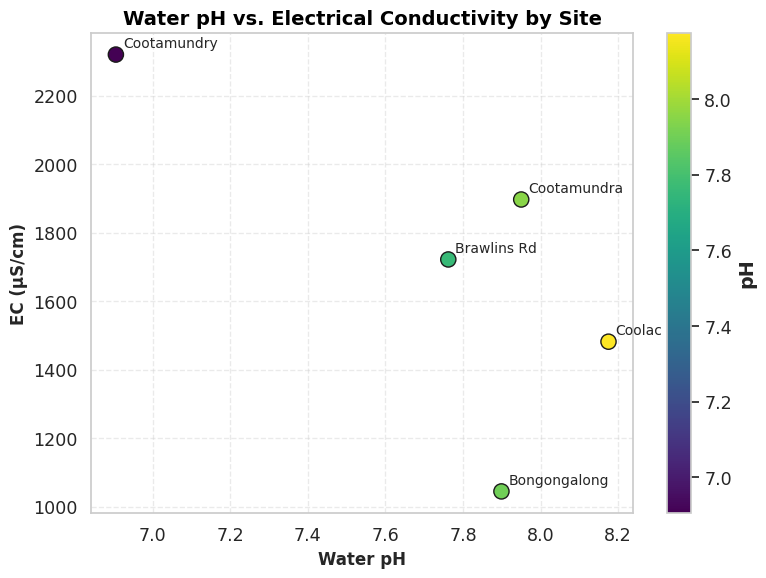

In [122]:
import matplotlib.pyplot as plt
import numpy as np

# Data
pH = np.array([8.175, 7.899, 7.762, 6.905, 7.950])
EC = np.array([1482, 1045, 1722, 2320, 1897])
sites = ['Coolac', 'Bongongalong', 'Brawlins Rd', 'Cootamundry', 'Cootamundra']

plt.figure(figsize=(8,6))
scatter = plt.scatter(pH, EC, c=pH, cmap='viridis', s=120, edgecolor='k')

# Add colorbar for pH
cbar = plt.colorbar(scatter)
cbar.set_label('pH')

# Annotate each point with the site name only
for i, site in enumerate(sites):
    plt.annotate(site, (pH[i], EC[i]), textcoords="offset points", xytext=(5,5), ha='left', fontsize=10)

plt.xlabel('Water pH', fontsize=12)
plt.ylabel('EC (μS/cm)', fontsize=12)
plt.title('Water pH vs. Electrical Conductivity by Site', fontsize=14, weight='bold')
plt.grid(True, linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()


NameError: name 'bars_legend' is not defined

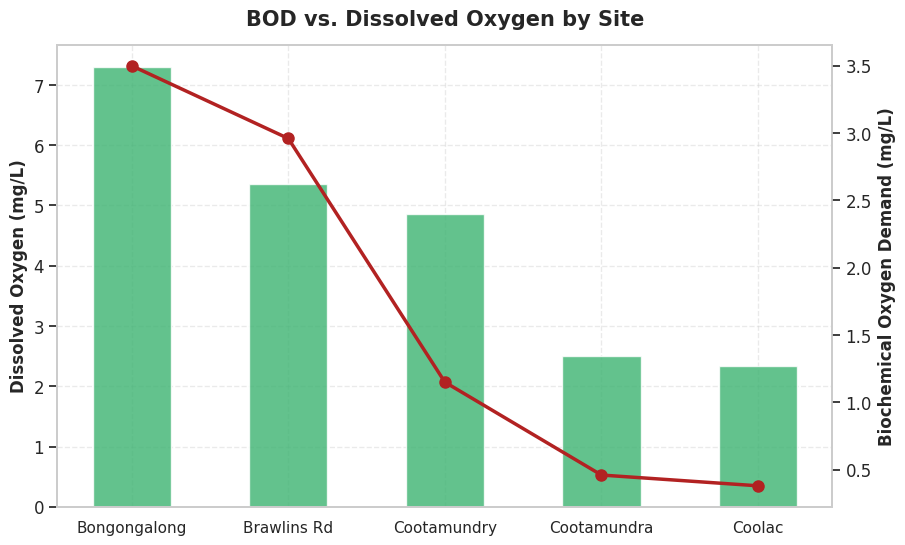

In [21]:
import matplotlib.pyplot as plt
import numpy as np

# Data
sites = ['Bongongalong', 'Brawlins Rd', 'Cootamundry', 'Cootamundra', 'Coolac']
do_avg = [7.30, 5.35, 4.85, 2.50, 2.34]  # Dissolved Oxygen (mg/L)
bod_avg = [3.50, 2.96, 1.15, 0.46, 0.38]  # BOD (mg/L)

x = np.arange(len(sites))

fig, ax1 = plt.subplots(figsize=(10,6))

# Bar plot for DO
bars = ax1.bar(x, do_avg, color='mediumseagreen', alpha=0.8, width=0.5, label='Dissolved Oxygen')
ax1.set_ylabel('Dissolved Oxygen (mg/L)', fontsize=12)
ax1.tick_params(axis='y')

# Line plot for BOD (secondary axis)
ax2 = ax1.twinx()
line = ax2.plot(x, bod_avg, 'o-', color='firebrick', linewidth=2.5, markersize=8, label='BOD')
ax2.set_ylabel('Biochemical Oxygen Demand (mg/L)', fontsize=12)
ax2.tick_params(axis='y')

# X-axis labels
ax1.set_xticks(x)
ax1.set_xticklabels(sites, fontsize=11)

# Grid and background
ax1.grid(True, linestyle='--', alpha=0.4, zorder=0)
ax2.grid(False)

# Title
plt.title('BOD vs. Dissolved Oxygen by Site', fontsize=15, weight='bold', pad=14)

# Custom legends
plt.legend(handles=[bars_legend, line_legend], loc='upper right', fontsize=11, frameon=True)

plt.tight_layout()
plt.show()


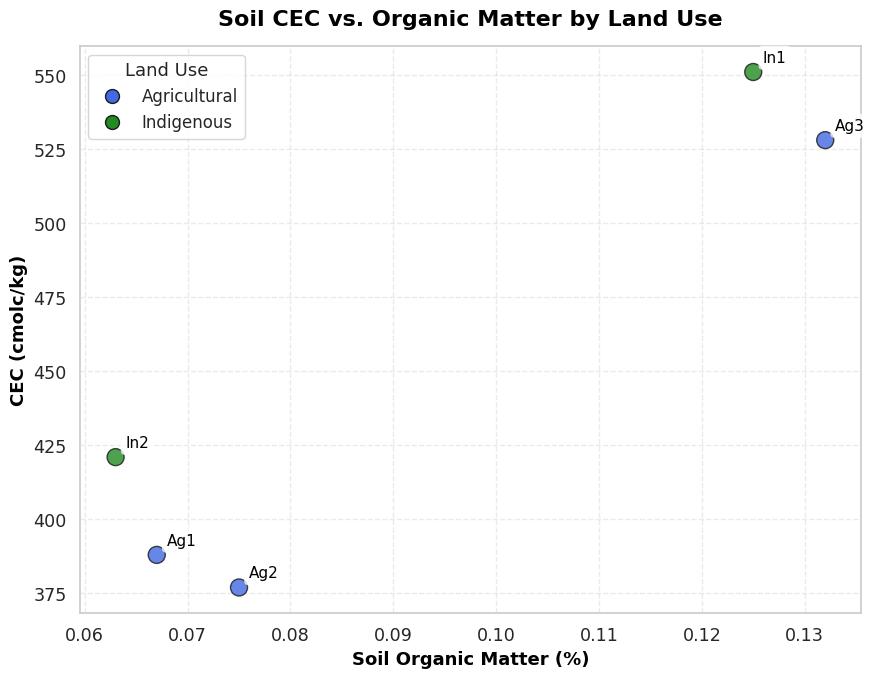

In [127]:
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

# Data grouped by land use (Agricultural/Indigenous) with sample codes
sample_codes = ['Ag1', 'Ag2', 'Ag3', 'In1', 'In2']  # Replace/add more as needed
land_use = ['Agricultural', 'Agricultural', 'Agricultural', 'Indigenous', 'Indigenous']
organic_matter = [0.067, 0.075, 0.132, 0.125, 0.063]  # Soil organic matter (%)
cec = [388, 377, 528, 551, 421]  # CEC (cmolc/kg)

# Color mapping by land use
colors = ['royalblue' if lu == 'Agricultural' else 'forestgreen' for lu in land_use]

plt.figure(figsize=(9,7))
plt.scatter(organic_matter, cec, c=colors, s=150, edgecolor='k', alpha=0.8, zorder=2)

# Annotate each point with sample code in white box
for i, code in enumerate(sample_codes):
    plt.annotate(
        code, 
        (organic_matter[i], cec[i]), 
        textcoords="offset points", 
        xytext=(7,7), 
        ha='left', 
        fontsize=11,
        color='black',
        bbox=dict(
            boxstyle="round,pad=0.3",
            facecolor='white',
            edgecolor='none',
            alpha=0.8
        )
    )

# Custom legend for land use
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Agricultural', 
           markerfacecolor='royalblue', markersize=10, markeredgecolor='k'),
    Line2D([0], [0], marker='o', color='w', label='Indigenous', 
           markerfacecolor='forestgreen', markersize=10, markeredgecolor='k')
]

plt.xlabel('Soil Organic Matter (%)', fontsize=13, color='black', weight='bold')
plt.ylabel('CEC (cmolc/kg)', fontsize=13, color='black', weight='bold')
plt.title('Soil CEC vs. Organic Matter by Land Use', fontsize=16, color='black', weight='bold', pad=15)
plt.grid(True, linestyle='--', alpha=0.4)
plt.legend(handles=legend_elements, title='Land Use', fontsize=12, title_fontsize=13, loc='upper left', frameon=True)
plt.tight_layout()
plt.show()


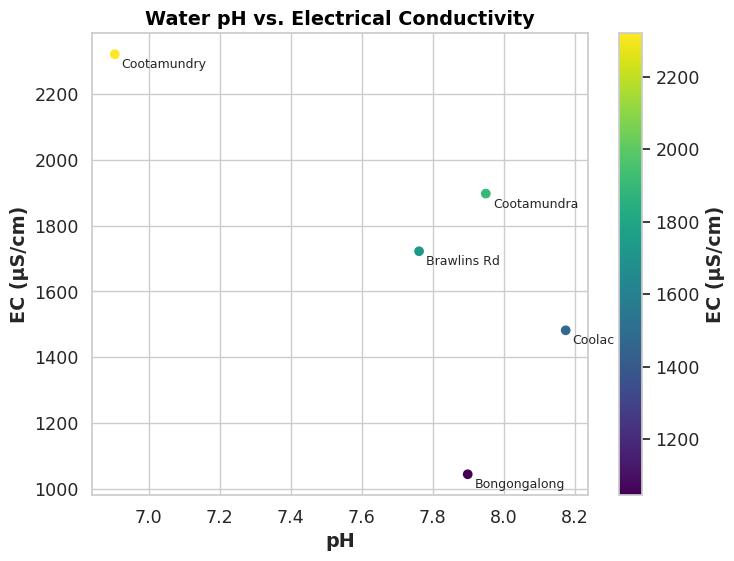

In [128]:
import matplotlib.pyplot as plt

pH = [8.175, 7.899, 7.762, 6.905, 7.950]  # Sites: Coolac, Bongongalong, Brawlins Rd, Cootamundry, Cootamundra
EC = [1482, 1045, 1722, 2320, 1897]  # μS/cm
sites = ['Coolac', 'Bongongalong', 'Brawlins Rd', 'Cootamundry', 'Cootamundra']

plt.figure(figsize=(8,6))
scatter = plt.scatter(pH, EC, c=EC, cmap='viridis')
plt.colorbar(label='EC (μS/cm)')
plt.xlabel('pH')
plt.ylabel('EC (μS/cm)')
plt.title('Water pH vs. Electrical Conductivity')

# Add labels to each point
for i, site in enumerate(sites):
    plt.annotate(site, (pH[i], EC[i]), textcoords="offset points", xytext=(5,-10), ha='left', fontsize=9)

plt.show()



In [20]:
print(df.columns)


Index(['Site', 'Depth', 'Sand', 'Silt', 'Clay'], dtype='object')


In [12]:
import pandas as pd

# Updated data including EC (μS/cm)
df = pd.DataFrame({
    'Sand': [58.0, 55.1, 39.4],
    'Silt': [28.8, 27.2, 25.4],
    'Clay': [13.2, 17.7, 35.2],
    'Total P': [0.85, 0.31, 0.45],
    'CEC': [421.3, 551.2, 377.9],
    'EC': [1482, 1045, 2320],  # EC in μS/cm
    'Land Use': ['Agricultural', 'Agricultural', 'Indigenous']
})

print(df)


   Sand  Silt  Clay  Total P    CEC    EC      Land Use
0  58.0  28.8  13.2     0.85  421.3  1482  Agricultural
1  55.1  27.2  17.7     0.31  551.2  1045  Agricultural
2  39.4  25.4  35.2     0.45  377.9  2320    Indigenous


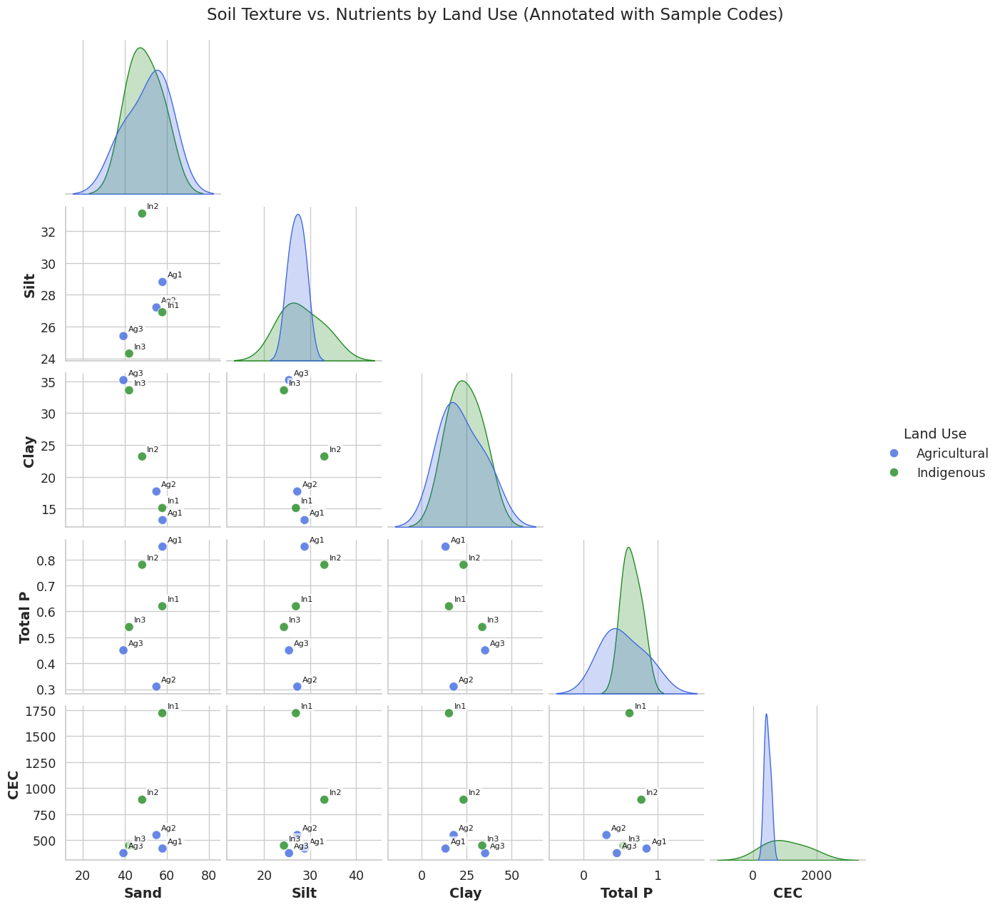

In [129]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Example soil data with sample codes
df = pd.DataFrame({
    'Sand': [58.0, 55.1, 39.4, 57.9, 48.3, 42.1],
    'Silt': [28.8, 27.2, 25.4, 26.9, 33.1, 24.3],
    'Clay': [13.2, 17.7, 35.2, 15.1, 23.2, 33.6],
    'Total P': [0.85, 0.31, 0.45, 0.62, 0.78, 0.54],
    'CEC': [421, 551, 377, 1721, 890, 450],
    'Land Use': ['Agricultural', 'Agricultural', 'Agricultural', 
                 'Indigenous', 'Indigenous', 'Indigenous'],
    'Depth': ['0-10cm', '10-20cm', '20-30cm', 
              '0-10cm', '10-20cm', '20-30cm'],
    'Sample Code': ['Ag1', 'Ag2', 'Ag3', 'In1', 'In2', 'In3']  # Added sample codes
})

g = sns.pairplot(
    data=df,
    vars=['Sand', 'Silt', 'Clay', 'Total P', 'CEC'],
    hue='Land Use',
    palette={'Agricultural': 'royalblue', 'Indigenous': 'forestgreen'},
    corner=True,
    plot_kws={'s': 80, 'alpha': 0.8}
)

# Annotate each point with sample code in white box
for ax in g.axes.flat:
    if ax is not None:
        x_var = ax.get_xlabel()
        y_var = ax.get_ylabel()
        if x_var in df.columns and y_var in df.columns:
            for i, row in df.iterrows():
                ax.annotate(
                    row['Sample Code'],
                    (row[x_var], row[y_var]),
                    textcoords="offset points",
                    xytext=(5,5),
                    ha='left', 
                    fontsize=8,
                    alpha=0.9,
                    color='black',
                    bbox=dict(
                        boxstyle="round,pad=0.2",
                        facecolor='white',
                        edgecolor='none',
                        alpha=0.7
                    )
                )

plt.suptitle('Soil Texture vs. Nutrients by Land Use (Annotated with Sample Codes)', y=1.02)
plt.show()


In [ ]:
INFO FOR FIGURES:

What These Results Mean
1. Soil and Water Chemistry Measurements
You measured properties like soil organic matter, pH, electrical conductivity (EC), cation exchange capacity (CEC), soil texture, and nutrients (N, P) at various depths and land uses (agricultural vs indigenous).

For water, you measured pH, EC, dissolved organic carbon, nitrogen, phosphorus, dissolved oxygen, and biochemical oxygen demand at different river sites.

2. What Each Parameter Indicates
Soil Organic Matter (SOM): Indicates fertility and the soil’s ability to hold nutrients and water. Higher SOM usually means healthier, more resilient soils.

CEC (Cation Exchange Capacity): Reflects the soil’s ability to retain and supply nutrients to plants. High CEC is generally good for fertility.

Soil Texture (Sand/Silt/Clay): Affects water retention, drainage, and nutrient availability. Clay-rich soils hold more water and nutrients but may drain poorly.

pH: Influences nutrient availability and microbial activity. Extreme pH (too acidic or alkaline) can limit plant growth.

EC (Electrical Conductivity): Indicates salinity; high EC can harm plants, reduce yields, and signal salinization risk.

Nutrients (N, P): Essential for plant growth, but excess in water leads to pollution (eutrophication).

3. Land Use Comparison
By comparing agricultural and indigenous soils, you can see how farming changes soil health, fertility, and salinity risk.

Typically, agricultural soils may show lower organic matter and CEC (due to disturbance and cropping), and sometimes higher EC (from fertilizer or irrigation salt buildup).

Why This Is Relevant
A. Environmental and Agricultural Management
Salinity risk: High EC in soil or water means salinity is a problem, which can reduce crop yields, damage infrastructure, and harm aquatic ecosystems.

Soil health: Low organic matter and CEC in agricultural soils indicate possible degradation, requiring better management (e.g., cover crops, organic amendments).

Nutrient pollution: High N or P in water samples signals runoff from agriculture, which can cause algal blooms and fish kills downstream.

B. Understanding Human Impact
Your results show how land use changes (like clearing native vegetation for farming) affect soil and water chemistry.

This helps explain why some catchments are more at risk of salinity, erosion, or nutrient pollution.

C. Meeting Environmental Standards
Your lab manual and national guidelines set thresholds (e.g., EC > 800 μS/cm is risky for crops).

By comparing your results to these thresholds, you can identify sites or depths at risk and recommend management actions.

How This Fits Your Lab’s Aims
The lab aims to give you practical skills in environmental sampling and analysis, and to help you interpret real-world data to address issues like salinity, soil degradation, and water quality.

Your findings are directly relevant to catchment management, sustainable agriculture, and environmental protection in Australia’s river systems.




In [130]:
import plotly.express as px
import pandas as pd

# Example soil texture data grouped by land use and depth
df = pd.DataFrame({
    'Sample': ['Ag1', 'Ag2', 'Ag3', 'In1', 'In2', 'In3'],
    'Land Use': ['Agricultural']*3 + ['Indigenous']*3,
    'Depth': ['0-10cm', '10-20cm', '20-30cm']*2,
    'Sand': [58.0, 55.1, 39.4, 57.9, 48.3, 42.1],
    'Silt': [28.8, 27.2, 25.4, 26.9, 33.1, 24.3],
    'Clay': [13.2, 17.7, 35.2, 15.1, 23.2, 33.6]
})

fig = px.scatter_ternary(
    df, a='Sand', b='Silt', c='Clay',
    color='Land Use',
    symbol='Depth',
    hover_name='Sample',
    title='Soil Texture by Land Use and Depth'
)
fig.update_traces(marker=dict(size=12, line=dict(width=1, color='DarkSlateGrey')))
fig.show()


In [ ]:
What does this ternary plot show?
A soil texture ternary plot displays the proportion of sand, silt, and clay in each soil sample. Each point represents a sample, and its position shows its relative percentages of these three fractions. In your updated code, the samples are grouped by land use (Agricultural vs Indigenous) and depth (0–10 cm, 10–20 cm, 20–30 cm).

Why is this relevant?
Soil texture is a fundamental property: It affects water retention, drainage, nutrient availability, and susceptibility to erosion or salinization.

Land use and depth patterns: By plotting by land use and depth, you can see if agricultural soils are, for example, sandier or have more clay than indigenous soils, and how texture changes with depth.

Management implications: Texture influences how soils respond to irrigation, fertilization, and cropping. Clay-rich soils may hold more water and nutrients but are prone to waterlogging and salinity; sandy soils drain quickly but may lose nutrients.

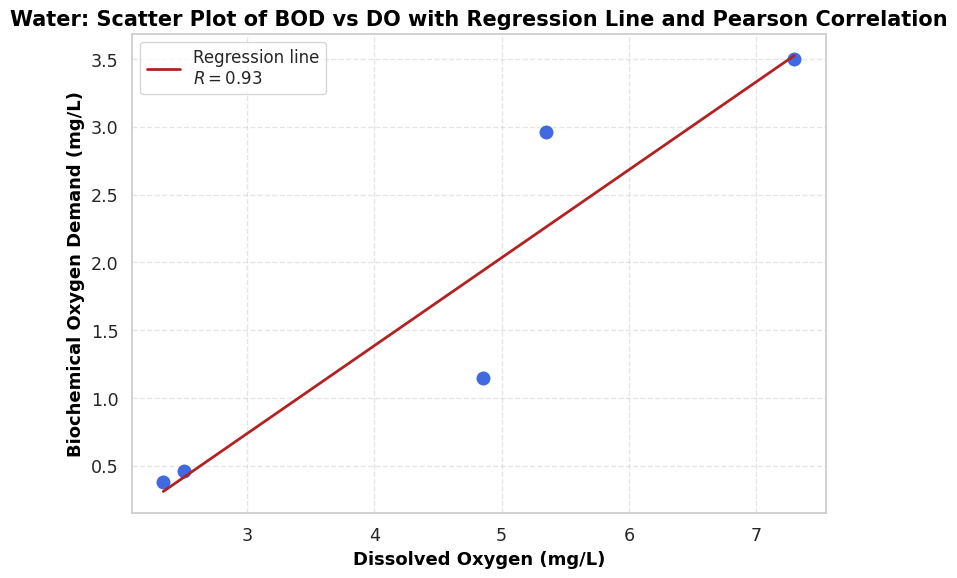

In [131]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import pearsonr
import seaborn as sns

# Example data for DO and BOD by site (replace with your actual data if needed)
do_avg = np.array([7.30, 5.35, 4.85, 2.50, 2.34])  # Dissolved Oxygen (mg/L)
bod_avg = np.array([3.50, 2.96, 1.15, 0.46, 0.38])  # BOD (mg/L)

# Calculate Pearson correlation coefficient
corr, p_value = pearsonr(do_avg, bod_avg)

plt.figure(figsize=(8,6))

# Scatter points
sns.scatterplot(x=do_avg, y=bod_avg, s=120, color='royalblue')

# Regression line
m, b = np.polyfit(do_avg, bod_avg, 1)
plt.plot(do_avg, m*do_avg + b, color='firebrick', linewidth=2, label=f'Regression line\n$R = {corr:.2f}$')

# Labels and title
plt.xlabel('Dissolved Oxygen (mg/L)', fontsize=13, color='black')
plt.ylabel('Biochemical Oxygen Demand (mg/L)', fontsize=13, color='black')
plt.title('Water: Scatter Plot of BOD vs DO with Regression Line and Pearson Correlation', fontsize=15, color='black', weight='bold')
plt.legend(loc='upper left', fontsize=12, frameon=True)
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()
